# Стадтарная генерация

## Импорт и установка необходимого

In [1]:
!pip install diffusers transformers scipy ftfy "ipywidgets>=7,<8"

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 934.9/934.9 kB 7.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.0/7.0 MB 42.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.1/53.1 kB 1.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 224.5/224.5 kB 13.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 62.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 54.8 MB/s eta 0:00:00


In [2]:
import os
import google.colab.output

import torch
from torch import autocast

from diffusers import StableDiffusionPipeline

from huggingface_hub import notebook_login
from PIL import Image, ImageDraw

device = 'cuda'

The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

## Pipeline по Умолчанию

In [3]:
model_id = "stabilityai/stable-diffusion-2-base"

pipe = StableDiffusionPipeline.from_pretrained(model_id, 
                                               torch_dtype=torch.float16,
                                               low_cpu_mem_usage=False)

pipe = pipe.to(device)

Fetching 13 files:   0%|          | 0/13 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/transformers/models/clip/feature_extraction_clip.py:28: FutureWarning: The class CLIPFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use CLIPImageProcessor instead.
  warnings.warn(


In [4]:
def image_grid(imgs, rows, cols):
    assert len(imgs) == rows*cols

    w, h = imgs[0].size
    grid = Image.new('RGB', size=(cols*w, rows*h))
    grid_w, grid_h = grid.size
    
    for i, img in enumerate(imgs):
        grid.paste(img, box=(i%cols*w, i//cols*h))
    return grid

In [5]:
num_images = 4

width = 512
height = 512

In [6]:
generator = torch.Generator(device=device)

latents = None
seeds = []
for _ in range(num_images):
    # Get a new random seed, store it and use it as the generator state
    seed = generator.seed()
    seeds.append(seed)
    generator = generator.manual_seed(seed)
    
    image_latents = torch.randn(
        (1, pipe.unet.config.in_channels, height // 8, width // 8),
        generator = generator,
        device = device
    )
    latents = image_latents if latents is None else torch.cat((latents, image_latents))
    
# latents should have shape (4, 4, 64, 64) in this case
latents.shape

torch.Size([4, 4, 64, 64])

In [11]:
seed = seeds[1]   # Second one
seed

generator.manual_seed(seed)

latents = torch.randn(
    (1, pipe.unet.config.in_channels, height // 8, width // 8),
    generator = generator,
    device = device
)

  0%|          | 0/50 [00:00<?, ?it/s]

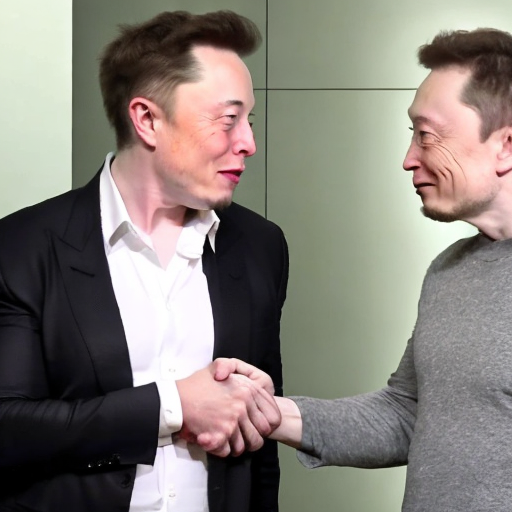

In [12]:
prompt = "Elon Musk and Artificial intelligence shake hands to each other and hiding a knives behind theirs back"

with torch.autocast("cuda"):
    image = pipe(
        [prompt] * 1,
        guidance_scale=7.5,
        latents = latents,
    )["images"]
    
image[0]

wtf Илон Маск и есть искусственный интеллект? Или Справа был сгенерирован фронтмен из группы Кровосток?

  0%|          | 0/50 [00:00<?, ?it/s]

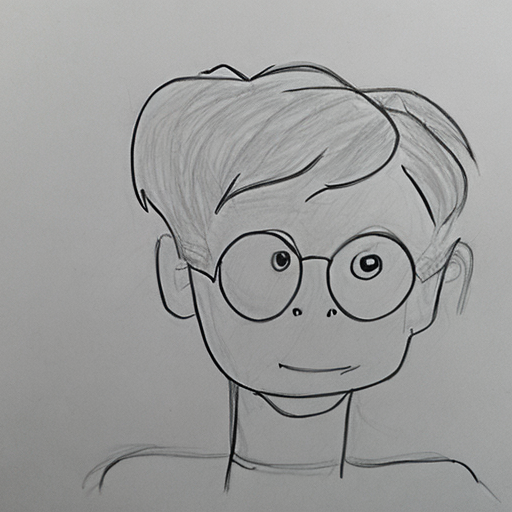

In [27]:
prompt = "Draw anything you want"

with torch.autocast("cuda"):
    image = pipe(
        [prompt] * 1,
        guidance_scale=7.5,
        latents = latents,
    )["images"]
    
image[0]

Учитывая, что я ношу такие же круглые очки, на мгновение стало не по себе

  0%|          | 0/50 [00:00<?, ?it/s]

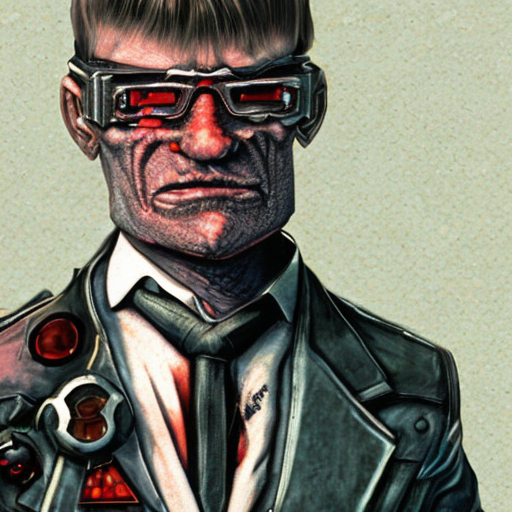

In [48]:
prompt = "German Gref in CYBERPUNK"

with torch.autocast("cuda"):
    image = pipe(
        [prompt] * 1,
        guidance_scale=7.5,
        latents = latents,
    )["images"]
    
image[0]

kupi kolonky.

  0%|          | 0/50 [00:00<?, ?it/s]

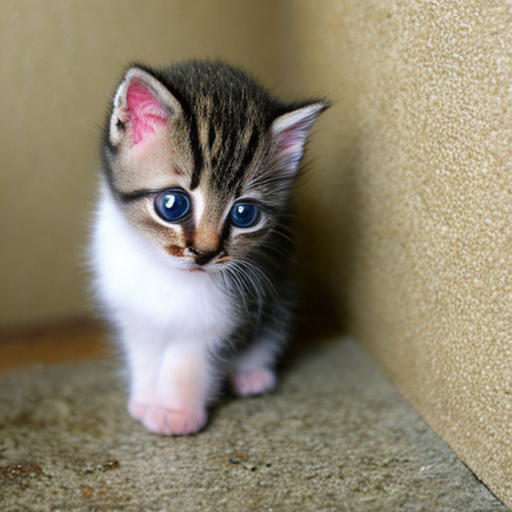

In [50]:
prompt = "very shy little kitten"

with torch.autocast("cuda"):
    image = pipe(
        [prompt] * 1,
        guidance_scale=7.5,
        latents = latents,
    )["images"]
    
image[0]

  0%|          | 0/50 [00:00<?, ?it/s]

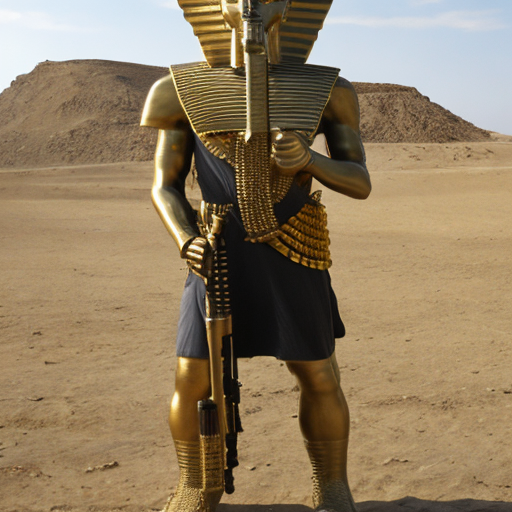

In [56]:
prompt = "Pharaoh with huge gun"

with torch.autocast("cuda"):
    image = pipe(
        [prompt] * 1,
        guidance_scale=7.5,
        latents = latents,
    )["images"]
    
image[0]

# Специализированная генерация

In [57]:
from diffusers import StableDiffusionPipeline
import torch

model_id = "dreamlike-art/dreamlike-photoreal-2.0"
pipe = StableDiffusionPipeline.from_pretrained(model_id, torch_dtype=torch.float16)
pipe = pipe.to("cuda")




Fetching 12 files:   0%|          | 0/12 [00:00<?, ?it/s]

Cannot initialize model with low cpu memory usage because `accelerate` was not found in the environment. Defaulting to `low_cpu_mem_usage=False`. It is strongly recommended to install `accelerate` for faster and less memory-intense model loading. You can do so with: 
```
pip install accelerate
```
.


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

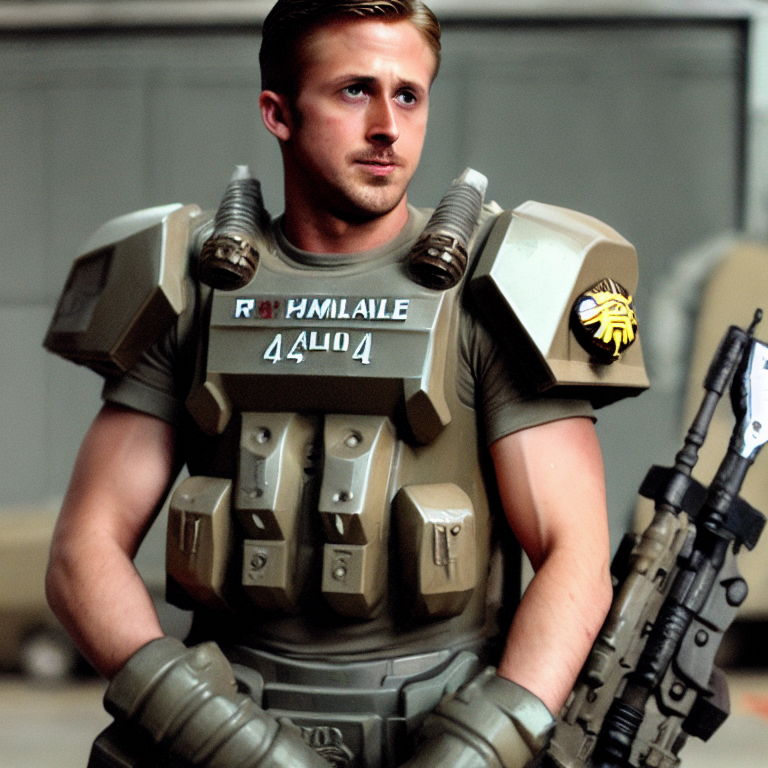

In [61]:
prompt = "Ryan Gosling warhammer 40000"
image = pipe(prompt).images[0]
image

да не умер он вконце операции

  0%|          | 0/50 [00:00<?, ?it/s]

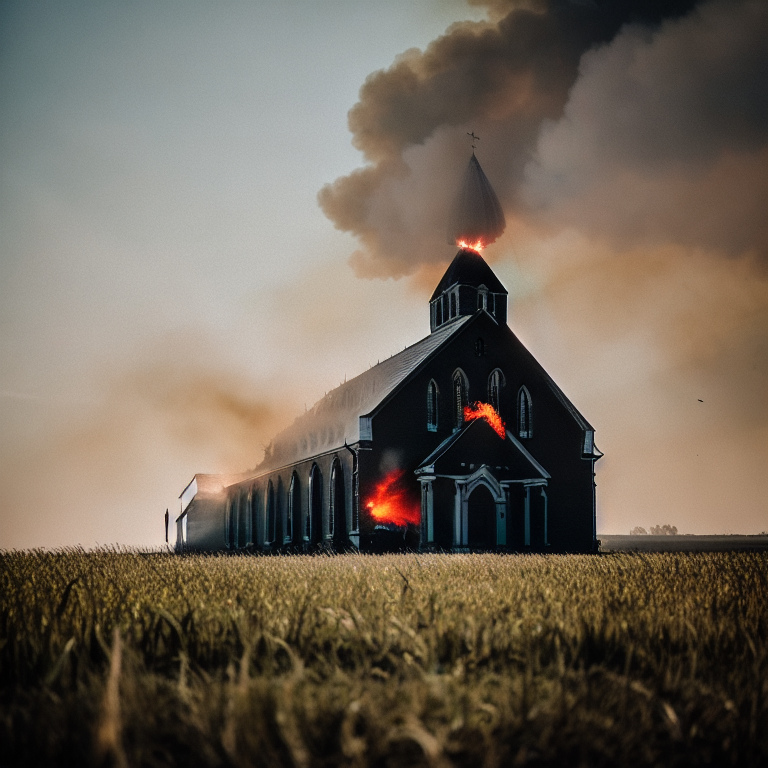

In [66]:
prompt = "photo, a church is on fire in the middle of a field of crops, bright cinematic lighting"
image = pipe(prompt).images[0]
image

  0%|          | 0/50 [00:00<?, ?it/s]

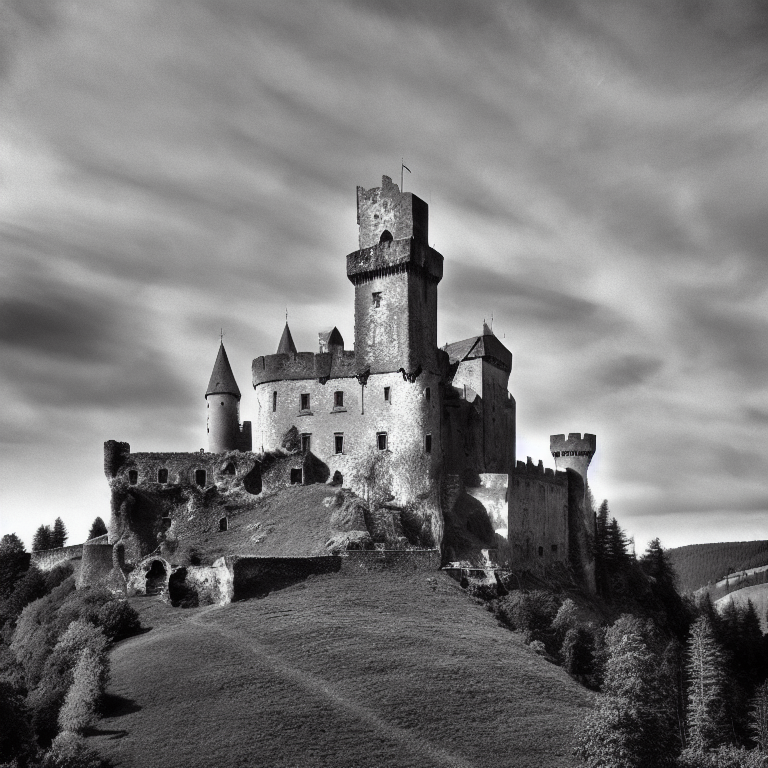

In [67]:
prompt = "photo, cursed old castle at corner of the hill"
image = pipe(prompt).images[0]
image

  0%|          | 0/50 [00:00<?, ?it/s]

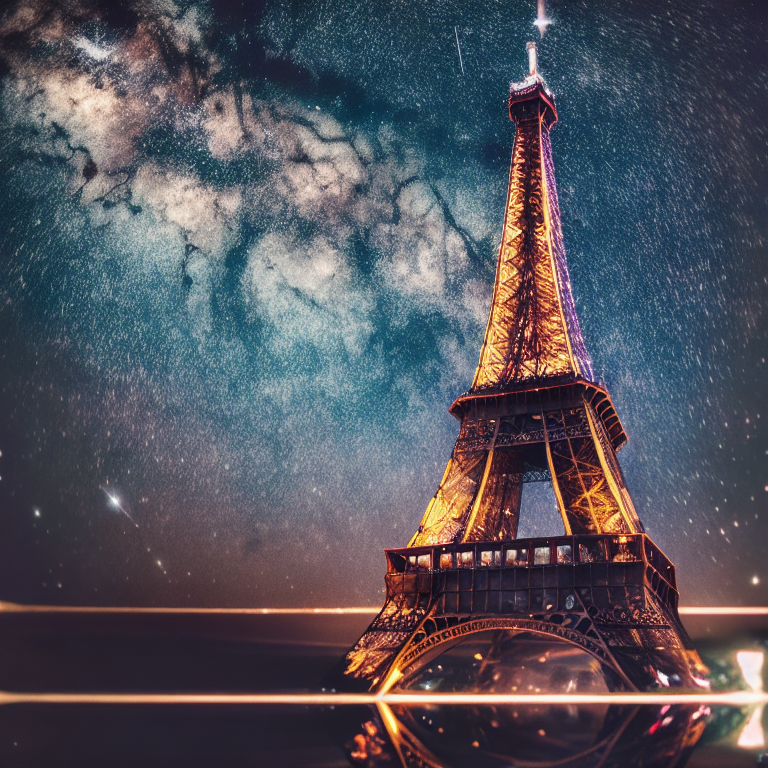

In [68]:
prompt = "photo, Eiffel Tower in the space among the stars"
image = pipe(prompt).images[0]
image

  0%|          | 0/50 [00:00<?, ?it/s]

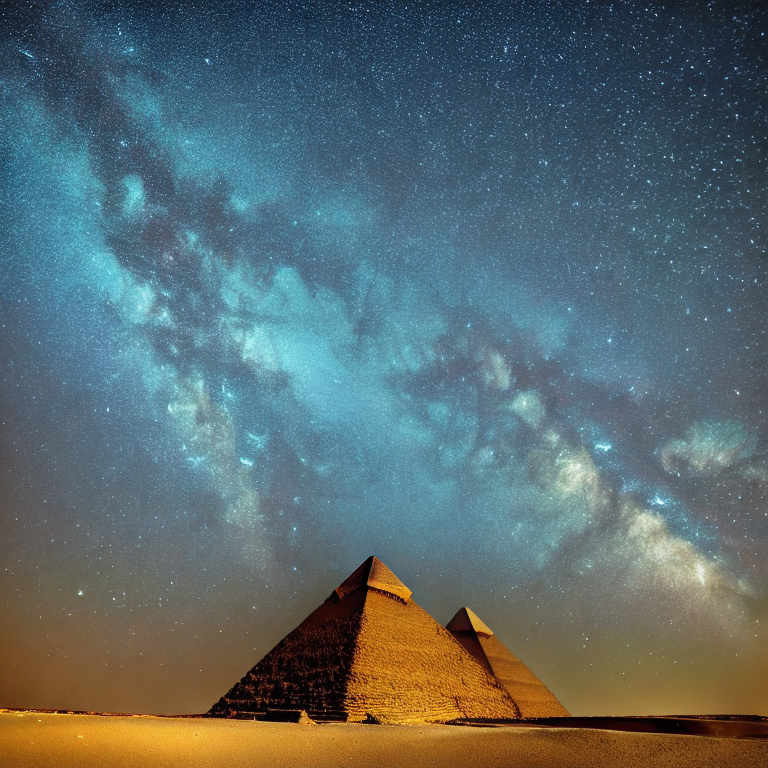

In [69]:
prompt = "photo, egypt pyramids against the backdrop of starfall"
image = pipe(prompt).images[0]
image

# Сложная генерация (изображение на прообразе)

## Импорт

In [72]:
import os
import google.colab.output

import torch
from torch import autocast

from PIL import Image, ImageDraw

from diffusers import StableDiffusionImg2ImgPipeline

import requests
from io import BytesIO

## Всякие настройки

In [71]:
model_id = "stabilityai/stable-diffusion-2-base"

pipe = StableDiffusionImg2ImgPipeline.from_pretrained(model_id, 
                                               torch_dtype=torch.float16,
                                               low_cpu_mem_usage=False)

pipe = pipe.to(device)

/usr/local/lib/python3.10/dist-packages/transformers/models/clip/feature_extraction_clip.py:28: FutureWarning: The class CLIPFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use CLIPImageProcessor instead.
  warnings.warn(


### картинка используя шаблон

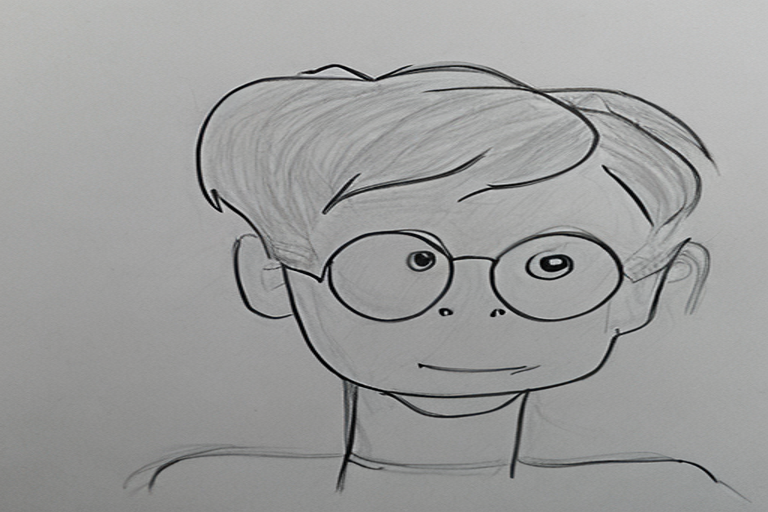

In [75]:
url = "https://i.ibb.co/ctkxkhW/2023-04-30-132329804.png"

response = requests.get(url)
init_img = Image.open(BytesIO(response.content)).convert("RGB")
init_img = init_img.resize((768, 512))
init_img

  0%|          | 0/37 [00:00<?, ?it/s]

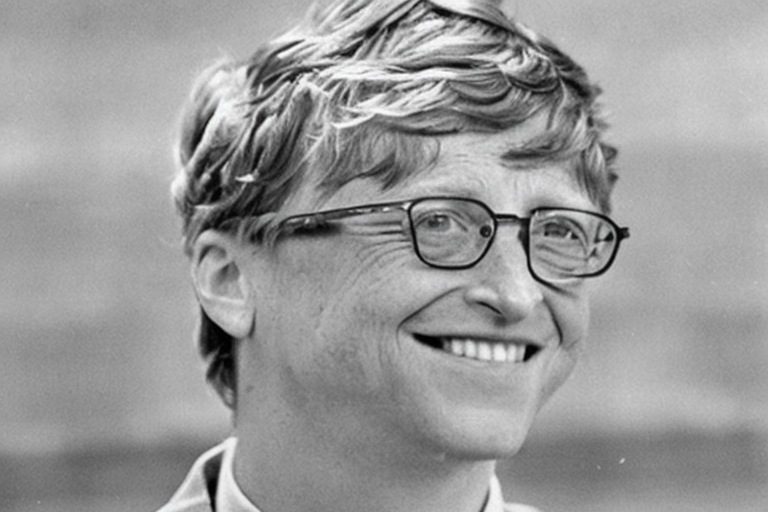

In [76]:
prompt = "young Bill Gates"

generator = torch.Generator(device=device).manual_seed(1024)
image = pipe(prompt=prompt, 
             image=init_img, 
             strength=0.75, 
             guidance_scale=7.5,
             generator=generator).images[0]

image

## картинка используя маску

In [77]:
from diffusers import StableDiffusionInpaintPipeline
import PIL

device = "cuda"

model_id = "stabilityai/stable-diffusion-2-inpainting"

pipe = StableDiffusionInpaintPipeline.from_pretrained(model_id, 
                                               torch_dtype=torch.float16,
                                               low_cpu_mem_usage=False)

pipe = pipe.to(device)

Fetching 13 files:   0%|          | 0/13 [00:00<?, ?it/s]

In [80]:
def image_grid(imgs, rows, cols):
    assert len(imgs) == rows*cols

    w, h = imgs[0].size
    grid = PIL.Image.new('RGB', size=(cols*w, rows*h))
    grid_w, grid_h = grid.size
    
    for i, img in enumerate(imgs):
        grid.paste(img, box=(i%cols*w, i//cols*h))
    return grid


def download_image(url):
    response = requests.get(url)
    return PIL.Image.open(BytesIO(response.content)).convert("RGB")

img_url = "https://sun9-7.userapi.com/impg/cfzPtvoC9xGs7pWlXHhKtAu_frJw0Sgaw7G_Qw/1q5Rsxi7rp8.jpg?size=640x648&quality=96&sign=fbbcd3f69955eb60088b0b882c53d14e&type=album"
mask_url = "https://i.ibb.co/SVv0mw6/2023-04-30-134044429.png"

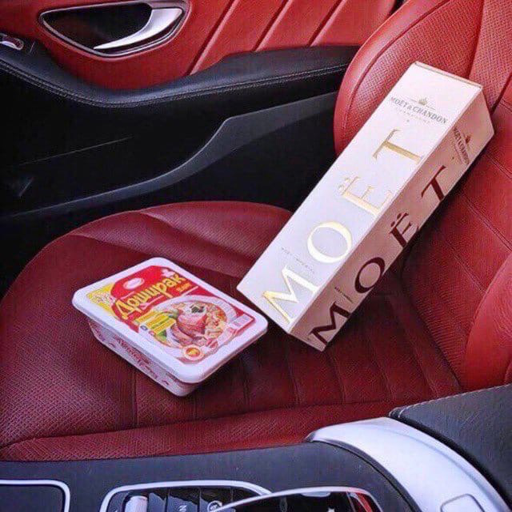

In [81]:
image = download_image(img_url).resize((512, 512))
image

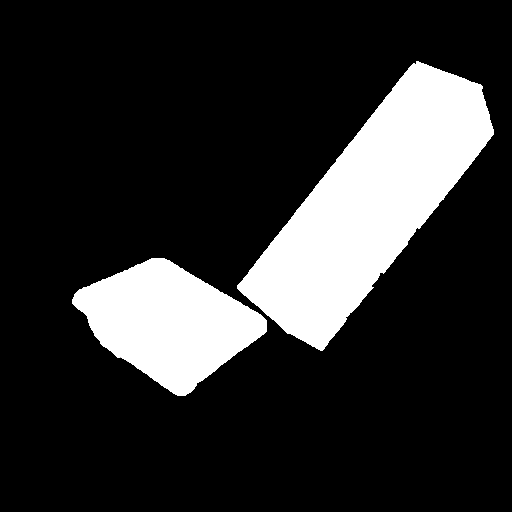

In [82]:
mask_image = download_image(mask_url).resize((512, 512))
mask_image

In [89]:
prompt = "Coca-cola and hamburger at car seatbelt"

guidance_scale=7.5
num_samples = 3
generator = torch.Generator(device="cuda").manual_seed(0) # change the seed to get different results

images = pipe(
    prompt=prompt,
    image=image,
    mask_image=mask_image,
    guidance_scale=guidance_scale,
    generator=generator,
    num_images_per_prompt=num_samples,
).images

# insert initial image in the list so we can compare side by side
images.insert(0, image)

  0%|          | 0/50 [00:00<?, ?it/s]

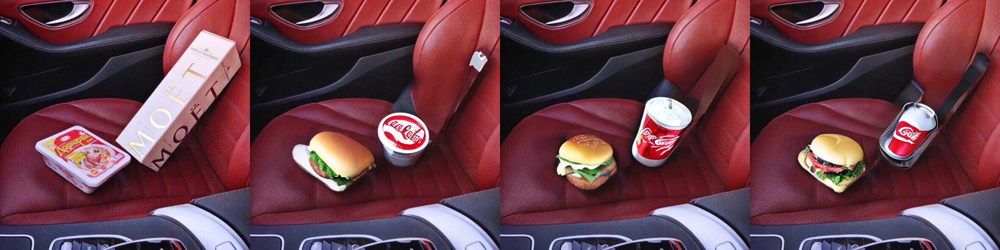

In [90]:
image_grid(images, 1, num_samples + 1)

### картинка используя ControlNet

#### Установка всякого

In [1]:
!pip install -q diffusers==0.14.0 transformers xformers git+https://github.com/huggingface/accelerate.git

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done


In [2]:
!pip install -q opencv-contrib-python
!pip install -q controlnet_aux

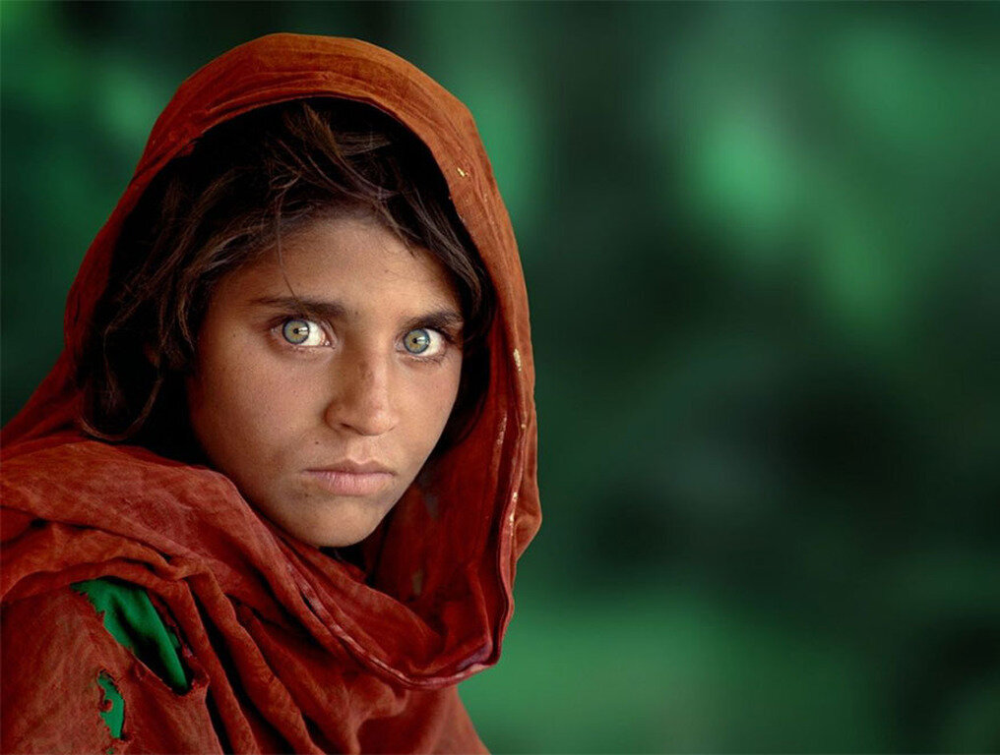

In [14]:
from diffusers import StableDiffusionControlNetPipeline
from diffusers.utils import load_image

image = load_image(
    "https://avatars.dzeninfra.ru/get-zen_doc/1583391/pub_5dc1537643863f00b13a676e_5dc1546134808200b1896f9b/scale_1200"
)
image

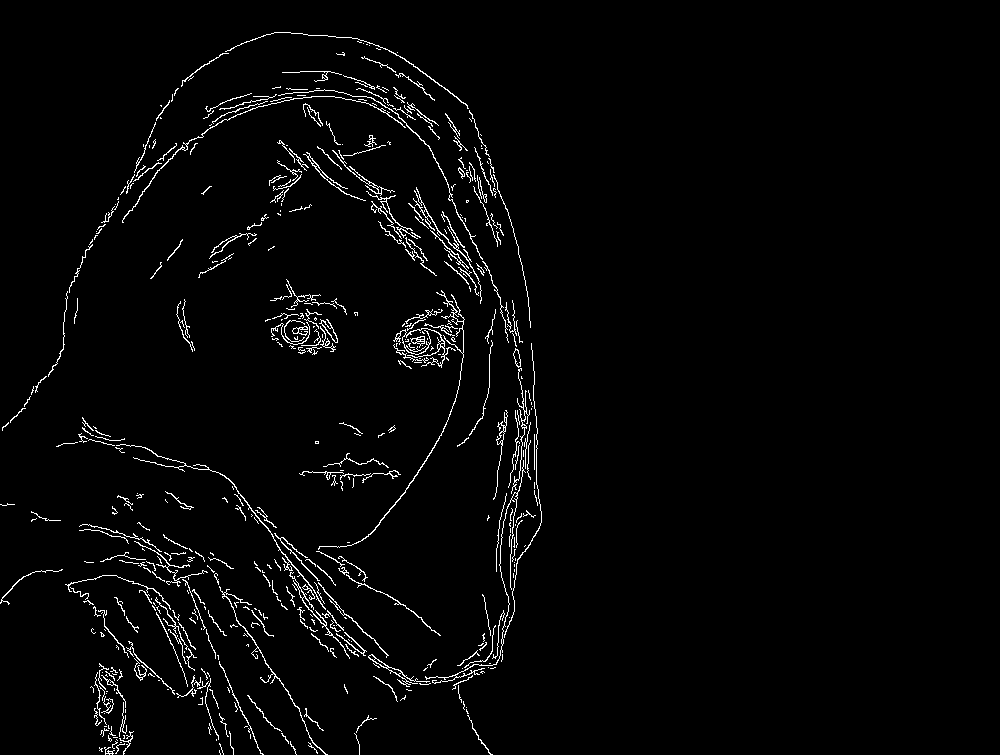

In [15]:
import cv2
from PIL import Image
import numpy as np

image = np.array(image)

low_threshold = 100
high_threshold = 200

image = cv2.Canny(image, low_threshold, high_threshold)
image = image[:, :, None]
image = np.concatenate([image, image, image], axis=2)
canny_image = Image.fromarray(image)
canny_image

In [5]:
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel
import torch

controlnet = ControlNetModel.from_pretrained("lllyasviel/sd-controlnet-canny", torch_dtype=torch.float16)
pipe = StableDiffusionControlNetPipeline.from_pretrained(
    "runwayml/stable-diffusion-v1-5", controlnet=controlnet, torch_dtype=torch.float16
)

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.
/usr/local/lib/python3.10/dist-packages/transformers/models/clip/feature_extraction_clip.py:28: FutureWarning: The class CLIPFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use CLIPImageProcessor instead.
  warnings.warn(


In [6]:
from diffusers import UniPCMultistepScheduler

pipe.scheduler = UniPCMultistepScheduler.from_config(pipe.scheduler.config)

pipe.enable_model_cpu_offload()

pipe.enable_xformers_memory_efficient_attention()

In [7]:
def image_grid(imgs, rows, cols):
    assert len(imgs) == rows * cols

    w, h = imgs[0].size
    grid = Image.new("RGB", size=(cols * w, rows * h))
    grid_w, grid_h = grid.size

    for i, img in enumerate(imgs):
        grid.paste(img, box=(i % cols * w, i // cols * h))
    return grid

In [18]:
generator = torch.manual_seed(2)
prompt = "a Hillary Diane Rodham Clinton, best quality, extremely detailed"
output = pipe(
    prompt,
    canny_image,
    negative_prompt="monochrome, lowres, bad anatomy, worst quality, low quality",
    generator=generator,
    num_inference_steps=20,
)

  0%|          | 0/20 [00:00<?, ?it/s]

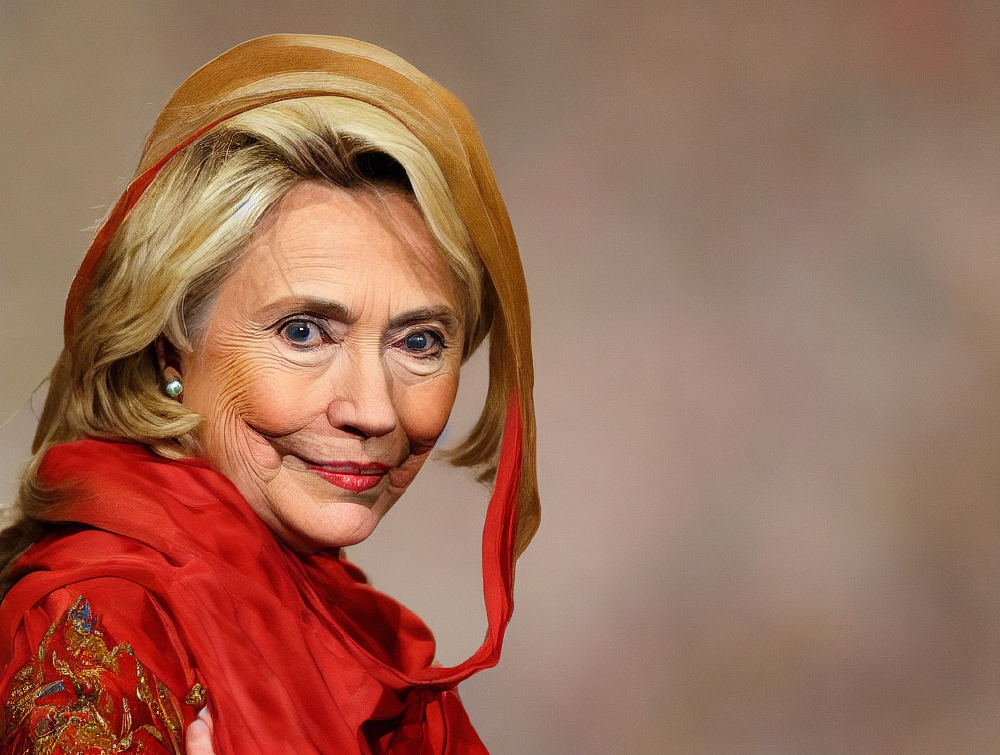

In [19]:
output.images[0]

### Картинка с Control Net Poses

In [1]:
!pip install -q diffusers==0.14.0 transformers xformers git+https://github.com/huggingface/accelerate.git
!pip install -q opencv-contrib-python
!pip install -q controlnet_aux

from diffusers import StableDiffusionControlNetPipeline
from diffusers.utils import load_image
import cv2
from PIL import Image
import numpy as np
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel
import torch
from diffusers import UniPCMultistepScheduler


  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done


In [2]:
def image_grid(imgs, rows, cols):
    assert len(imgs) == rows * cols

    w, h = imgs[0].size
    grid = Image.new("RGB", size=(cols * w, rows * h))
    grid_w, grid_h = grid.size

    for i, img in enumerate(imgs):
        grid.paste(img, box=(i % cols * w, i // cols * h))
    return grid

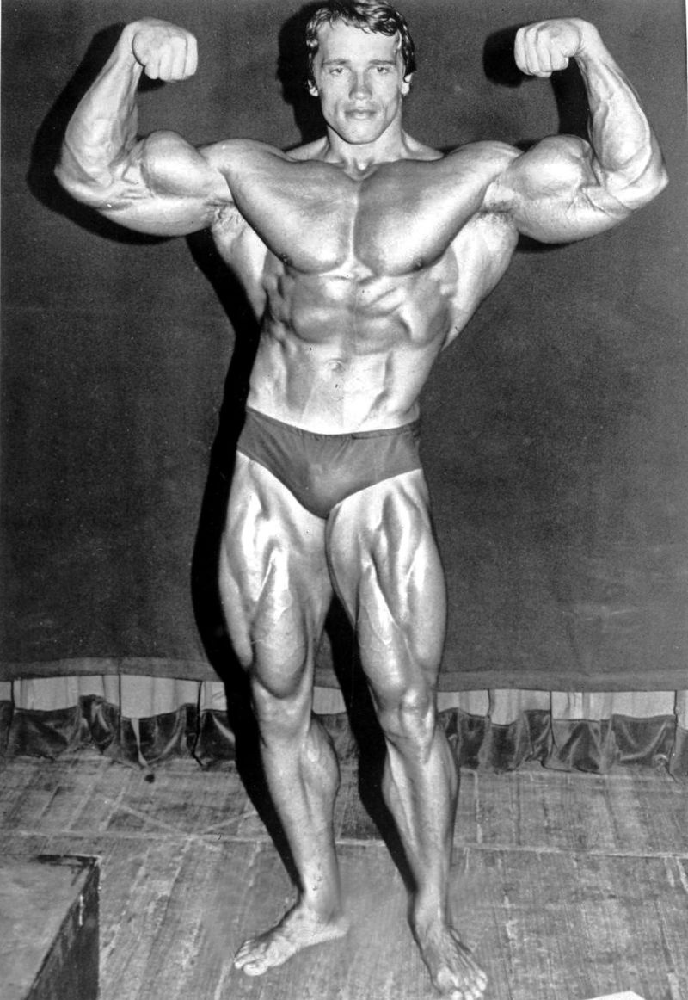

In [3]:
image = load_image(
    "https://static1-repo.aif.ru/1/14/887361/76f6fa2372d32cc118b7df0e89d998af.jpg"
)
image

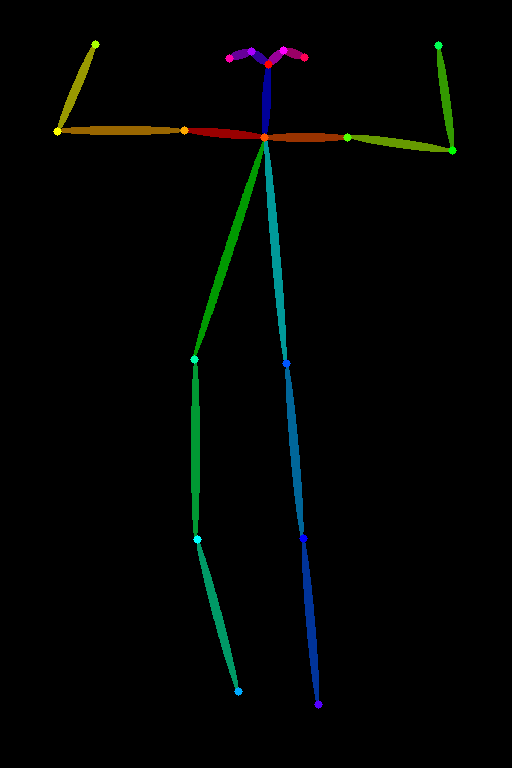

In [4]:
from controlnet_aux import OpenposeDetector

model = OpenposeDetector.from_pretrained("lllyasviel/ControlNet")

poses = model(image)
poses

In [5]:
controlnet = ControlNetModel.from_pretrained(
    "fusing/stable-diffusion-v1-5-controlnet-openpose", torch_dtype=torch.float16
)

model_id = "runwayml/stable-diffusion-v1-5"
pipe = StableDiffusionControlNetPipeline.from_pretrained(
    model_id,
    controlnet=controlnet,
    torch_dtype=torch.float16,
)
pipe.scheduler = UniPCMultistepScheduler.from_config(pipe.scheduler.config)
pipe.enable_model_cpu_offload()
pipe.enable_xformers_memory_efficient_attention()

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.
/usr/local/lib/python3.10/dist-packages/transformers/models/clip/feature_extraction_clip.py:28: FutureWarning: The class CLIPFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use CLIPImageProcessor instead.
  warnings.warn(


  0%|          | 0/25 [00:00<?, ?it/s]

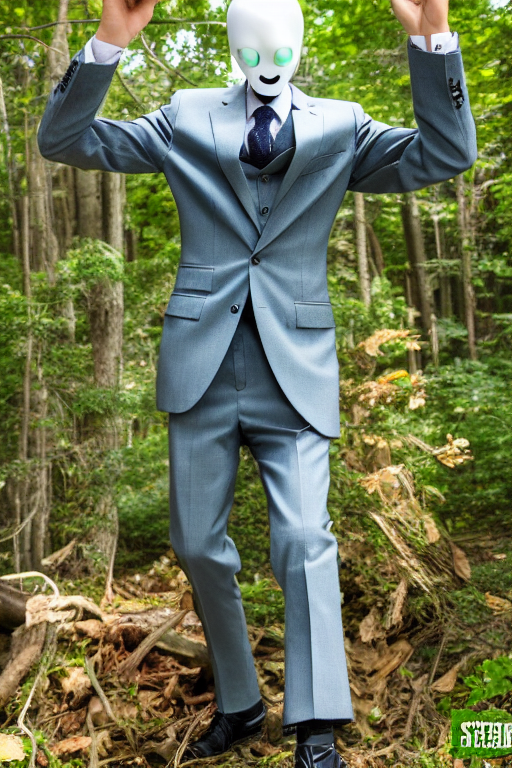

In [8]:
generator = torch.Generator(device="cpu").manual_seed(2)
prompt = "slenderman, best quality, extremely detailed"
output = pipe(
    prompt,
    poses,
    negative_prompt="monochrome, lowres, bad anatomy, worst quality, low quality",
    generator=generator,
    num_inference_steps=25,
)
output.images[0]